In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
from wordcloud import WordCloud


In [4]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Embedding,LSTM,Conv1D,MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,accuracy_score

In [5]:
from google.colab import drive
drive.mount('/content/drive/',force_remount=True)

Mounted at /content/drive/


In [7]:
fake=pd.read_csv("/content/drive/MyDrive/Fake.csv")

In [8]:
fake['subject'].value_counts()


News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

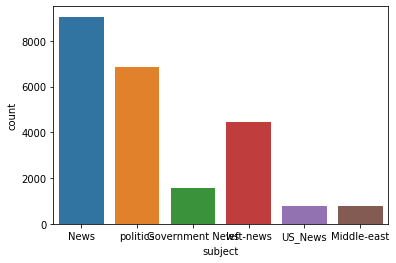

In [9]:
sns.countplot(x='subject',data=fake)

In [10]:
text=' '.join(fake['text'].tolist())

In [11]:
','.join(['this','is','a','data'])

'this,is,a,data'

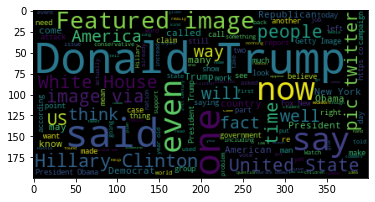

In [13]:
wordcloud = WordCloud().generate(text)
plt.imshow(wordcloud)

In [14]:
real=pd.read_csv("/content/drive/MyDrive/True.csv")

In [15]:
text=' '.join(fake['text'].tolist())

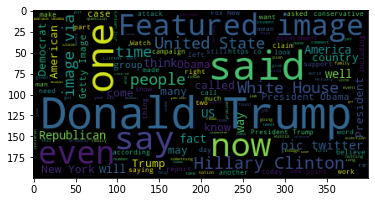

In [16]:
wordcloud = WordCloud().generate(text)
plt.imshow(wordcloud)

In [17]:
real.sample(5)

,title,text,subject,date
17601,Philippine anti-narcotics chief warns of drugs...,MANILA (Reuters) - The head of the Philippines...,worldnews,"October 13, 2017"
17484,Spain to take control of Catalonia if gets amb...,MADRID (Reuters) - The Spanish government will...,worldnews,"October 14, 2017"
11220,White House: IAEA report on Iran nuclear deal ...,WASHINGTON (Reuters) - The White House on Frid...,politicsNews,"January 15, 2016"
7427,Mexico says paying for Trump wall 'not part of...,MEXICO CITY (Reuters) - Mexico’s foreign minis...,politicsNews,"November 9, 2016"
17506,WHO says attack on Syria vaccine store leaves ...,LONDON (Reuters) - The World Health Organizati...,worldnews,"October 13, 2017"


In [30]:
unknown_publishers = []
for index , row in enumerate(real.text.values):
  try:
    record=row.split('-',maxsplit=1)
    record[1]

    assert(len(record[0])<120)
  except:
    unknown_publishers.append(index) 


In [31]:
real.iloc[unknown_publishers].text


7        The following statements were posted to the ve...
8        The following statements were posted to the ve...
12       The following statements were posted to the ve...
13       The following statements were posted to the ve...
14        (In Dec. 25 story, in second paragraph, corre...
                               ...                        
20135     (Story corrects to million from billion in pa...
20500     (This Sept 8 story corrects headline, clarifi...
20667     (Story refiles to add dropped word  not , in ...
21246     (Story corrects third paragraph to show Mosul...
21339     (Story corrects to fix spelling in paragraph ...
Name: text, Length: 221, dtype: object

In [32]:
real.iloc[8970]

title      Milestones in legal fight over Texas abortion law
text       (Reuters) - The U.S. Supreme Court is set to r...
subject                                         politicsNews
date                                          June 26, 2016 
Name: 8971, dtype: object

In [33]:
real=real.drop(8970,axis=0)

KeyError: ignored

In [34]:
publisher=[]
tmp_text=[]
for index , row in enumerate(real.text.values):
  if index in unknown_publishers:
    tmp_text.append(row)
    publisher.append("unknown")
  else:
    record=row.split('-',maxsplit=1)
    publisher.append(record[0].strip())
    tmp_text.append(record[1].strip())

In [35]:
real['publisher']=publisher
real['text']=tmp_text
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [37]:
real.shape

(21416, 5)

In [38]:
empty_fake_index = [index for index,text in enumerate(fake.text.tolist()) if str(text).strip()==""]

In [40]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [41]:
real['text']=real['title']+" "+real['text']

In [42]:
fake['text']=fake['title']+" "+fake['text']

In [43]:
real['text']=real['text'].apply(lambda x : str(x).lower())
fake['text']=fake['text'].apply(lambda x : str(x).lower())

In [44]:
real['class']=1
fake['class']=0


In [46]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [47]:
real=real[['text','class']]

In [48]:
fake=fake[['text','class']]

In [50]:
data = real.append(fake,ignore_index=True)

In [51]:
data.sample(5)

,text,class
29406,bernie sanders just received a crucial nevada...,0
38748,not grassroots: #ferguson protestors paid over...,0
22027,"trump aides scramble, say donald trump’s thre...",0
28194,not-at-all-racist sheriff amazingly compares ...,0
2600,eu divided on how to answer new u.s. sanctions...,1


In [52]:
!pip install spacy==2.2.3
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4==4.9.1
!pip install textblob==0.15.3
!pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall

     |████████████████████████████████| 10.4 MB 4.5 MB/s 
     |████████████████████████████████| 2.2 MB 33.4 MB/s 
  Attempting uninstall: thinc
    Found existing installation: thinc 7.4.0
    Uninstalling thinc-7.4.0:
      Successfully uninstalled thinc-7.4.0
  Attempting uninstall: spacy
    Found existing installation: spacy 2.2.4
    Uninstalling spacy-2.2.4:
      Successfully uninstalled spacy-2.2.4
     |████████████████████████████████| 12.0 MB 1.7 MB/s 
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
     |████████████████████████████████| 115 kB 5.3 MB/s 
  Attempting uninstall: beautifulsoup4
    Found existing installation: beautifulsoup4 4.6.3
    Uninstalling beautifulsoup4-4.6.3:
      Successfully uninstalled beautifulsoup4-4.6.3
  Cloning https://github.com/laxmimerit/preprocess_kgptalkie.git to /tmp/pip-req-build-ypg2j_93
  Running command git clone -q https://github.com/laxmimerit/preprocess_kgptalkie.git /tmp/pip

In [53]:
import preprocess_kgptalkie as ps

In [55]:
data['text']=data['text'].apply(lambda x : ps.remove_special_chars(x))

In [56]:
data.head()

,text,class
0,as us budget fight looms republicans flip thei...,1
1,us military to accept transgender recruits on ...,1
2,senior us republican senator let mr mueller do...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much more...,1


In [57]:
import gensim

In [58]:
y = data['class'].values

In [59]:
X = [d.split() for d in data['text'].tolist()]

In [61]:
type(X[0])

list

In [62]:
DIM=100
w2v_model=gensim.models.Word2Vec(sentences=X,size=DIM,window=10,min_count=1)
len(w2v_model.wv.vocab)

231911

In [66]:
w2v_model.wv.most_similar('india')

[('pakistan', 0.7325551509857178),
 ('malaysia', 0.7271676659584045),
 ('china', 0.6496622562408447),
 ('beijings', 0.616543173789978),
 ('thailand', 0.6103322505950928),
 ('indian', 0.6002998352050781),
 ('narendra', 0.5999456644058228),
 ('indonesia', 0.5953339338302612),
 ('indias', 0.5901966094970703),
 ('japan', 0.5899268984794617)]

In [67]:
tokenizer=Tokenizer()
tokenizer.fit_on_texts(X)

In [68]:
X=tokenizer.texts_to_sequences(X)

In [69]:
X


[[18,
  30,
  473,
  480,
  10667,
  133,
  8089,
  40,
  1375,
  5172,
  1,
  419,
  3,
  4,
  301,
  79,
  6312,
  6,
  1,
  30,
  189,
  29,
  773,
  26,
  279,
  9,
  4,
  1107,
  2956,
  3,
  1,
  124,
  954,
  2,
  447,
  9,
  184,
  1193,
  173,
  394,
  4,
  1375,
  301,
  8,
  342,
  5,
  1110,
  473,
  7805,
  6,
  1188,
  6,
  1764,
  16,
  4,
  3407,
  7897,
  141,
  164,
  320,
  133,
  30,
  798,
  921,
  7806,
  675,
  8,
  2010,
  476,
  1,
  383,
  1761,
  4,
  559,
  589,
  8,
  168,
  691,
  50,
  408,
  28,
  17340,
  2,
  89,
  1352,
  65,
  6,
  410,
  60,
  32,
  776,
  25,
  1,
  8090,
  8,
  203,
  408,
  39,
  1438,
  350,
  2,
  929,
  4,
  168,
  473,
  6,
  4,
  480,
  304,
  2,
  22,
  1957,
  2,
  80,
  426,
  170,
  18,
  313,
  208,
  107,
  18,
  1,
  515,
  570,
  96,
  1781,
  1504,
  6,
  50,
  133,
  39,
  1072,
  2,
  377,
  349,
  3,
  189,
  37,
  68,
  14,
  5,
  19,
  133,
  182,
  4,
  379,
  473,
  959,
  6,
  169,
  691,
  110,
  196,
  62,

In [70]:
tokenizer.word_index

{'the': 1,
 'to': 2,
 'of': 3,
 'a': 4,
 'and': 5,
 'in': 6,
 'that': 7,
 'on': 8,
 'for': 9,
 's': 10,
 'is': 11,
 'he': 12,
 'said': 13,
 'trump': 14,
 'it': 15,
 'with': 16,
 'was': 17,
 'as': 18,
 'his': 19,
 'by': 20,
 'has': 21,
 'be': 22,
 'have': 23,
 'not': 24,
 'from': 25,
 'this': 26,
 'at': 27,
 'are': 28,
 'who': 29,
 'us': 30,
 'an': 31,
 'they': 32,
 'i': 33,
 'but': 34,
 'we': 35,
 'would': 36,
 'president': 37,
 'about': 38,
 'will': 39,
 'their': 40,
 'had': 41,
 'you': 42,
 't': 43,
 'been': 44,
 'were': 45,
 'people': 46,
 'more': 47,
 'or': 48,
 'after': 49,
 'which': 50,
 'she': 51,
 'her': 52,
 'one': 53,
 'if': 54,
 'its': 55,
 'out': 56,
 'all': 57,
 'what': 58,
 'state': 59,
 'when': 60,
 'new': 61,
 'also': 62,
 'up': 63,
 'there': 64,
 'over': 65,
 'no': 66,
 'house': 67,
 'donald': 68,
 'our': 69,
 'states': 70,
 'clinton': 71,
 'obama': 72,
 'government': 73,
 'can': 74,
 'just': 75,
 'him': 76,
 'so': 77,
 'than': 78,
 'republican': 79,
 'other': 80,
 'so

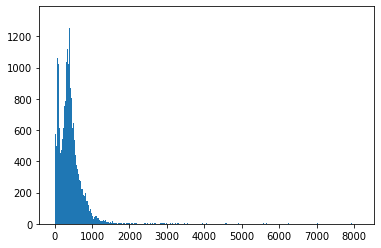

In [75]:
plt.hist([len(x) for x in X], bins=700)
plt.show()

In [76]:
nos = np.array([len(x) for x in X])
len(nos[nos>1000])

1584

In [77]:
maxlen=1000
X=pad_sequences(X,maxlen=maxlen)


In [79]:
len(X[101])

1000

In [81]:
vocab_size=len(tokenizer.word_index)+1
vocab = tokenizer.word_index

In [87]:
def get_weight_matrix(model):
  weight_matrix = np.zeros((vocab_size,DIM))
  for word, i in vocab.items():
    weight_matrix[i] = model.wv[word]
  return weight_matrix

In [88]:
embedding_vectors = get_weight_matrix(w2v_model)

In [89]:
embedding_vectors.shape

(231912, 100)

In [90]:
model=Sequential()
model.add(Embedding(vocab_size,output_dim=DIM,weights=[embedding_vectors],input_length=maxlen,trainable=False))
model.add(LSTM(units=128))
model.add(Dense(1,activation='sigmoid'))
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['acc'])

In [93]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1000, 100)         23191200  
                                                                 
 lstm (LSTM)                 (None, 128)               117248    
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 23,308,577
Trainable params: 117,377
Non-trainable params: 23,191,200
_________________________________________________________________


In [94]:
X_train,X_test,y_train,y_test=train_test_split(X,y)

In [95]:
model.fit(X_train,y_train,validation_split=0.3,epochs=6)

Epoch 1/6
737/737 [==============================] - 126s 164ms/step - loss: 0.1351 - acc: 0.9516 - val_loss: 0.0794 - val_acc: 0.9727
Epoch 2/6
737/737 [==============================] - 126s 170ms/step - loss: 0.0569 - acc: 0.9814 - val_loss: 0.0473 - val_acc: 0.9843
Epoch 3/6
737/737 [==============================] - 120s 163ms/step - loss: 0.0349 - acc: 0.9883 - val_loss: 0.0327 - val_acc: 0.9881
Epoch 4/6
737/737 [==============================] - 120s 163ms/step - loss: 0.0239 - acc: 0.9928 - val_loss: 0.0321 - val_acc: 0.9899
Epoch 5/6
737/737 [==============================] - 120s 163ms/step - loss: 0.0215 - acc: 0.9933 - val_loss: 0.0217 - val_acc: 0.9921
Epoch 6/6
737/737 [==============================] - 120s 163ms/step - loss: 0.0073 - acc: 0.9980 - val_loss: 0.0214 - val_acc: 0.9932


In [109]:
y_pred=(model.predict(X_test)>=0.5).astype(int)


In [110]:
accuracy_score(y_test,y_pred)

0.9933184855233853

In [111]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      5924
           1       0.99      0.99      0.99      5301

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



In [118]:
x=['When did the decline of coal start? It started when natural gas took off that started to begin in (President George W.) Bushs administration.']


In [119]:
X_test

array([[     0,      0,      0, ...,     11,      4,   2104],
       [     0,      0,      0, ...,   7494,    112, 107242],
       [     0,      0,      0, ...,     40,    184,   2013],
       ...,
       [     0,      0,      0, ...,    134,  10138,   6286],
       [     0,      0,      0, ...,    197,    175,  93156],
       [     0,      0,      0, ...,    396,     26,    109]], dtype=int32)

In [135]:
def test(newstofind):
  x=[]
  x.append(newstofind)
#x=['Karnataka Chief Minister Basavaraj Bommai on Wednesday dropped big hint at issuing fresh set of COVID guidelines as the COVID cases are on the rise in certain areas of the state. It was reported that the state government may also impose fresh restrictions if the cases continue to rise. However, the chief minister said decision regarding the guidelines and restrictions will be taken in a state cabinet meeting on Thursday.']
  x=tokenizer.texts_to_sequences(x)
  x = pad_sequences(x,maxlen=maxlen)
  if(model.predict(x)>=0.5).astype(int) == [[1]]:
    return True
  else:
    return False

In [131]:
(model.predict(x)>=0.5).astype(int)

array([[1]])

In [144]:
test('The nuclear test conducted in our nation this time is the Earths 2,054th nuclear test. The five permanent members of the U.N. Security Council have conducted 99.99 percent of the total nuclear tests.')

True